Lorena Ciutacu | SPICED Academy | Stochastic Sage

# Week 5: Time Series Analysis

## *Task*: Forecast the weather and plot climate data on a map.

## SETUP

In [178]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#plt.rcParams['figure.figsize'] = (12,6)
import datetime
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_pacf
from sklearn.metrics import mean_squared_error as MSE

In [28]:
f = open('/home/lorena/Documents/bootcamp/W05/data/ECA_blended_custom/TG_STAID004563.txt')
df_lines = f.readlines()[19:]
print(df_lines)

, '121152,20190203,   10,    0\n', '121152,20190204,    9,    0\n', '121152,20190205,   23,    0\n', '121152,20190206,   36,    0\n', '121152,20190207,   31,    0\n', '121152,20190208,   57,    0\n', '121152,20190209,   78,    0\n', '121152,20190210,   67,    0\n', '121152,20190211,   44,    0\n', '121152,20190212,   29,    0\n', '121152,20190213,   61,    0\n', '121152,20190214,   67,    0\n', '121152,20190215,   57,    0\n', '121152,20190216,   75,    0\n', '121152,20190217,   64,    0\n', '121152,20190218,   81,    0\n', '121152,20190219,   65,    0\n', '121152,20190220,   71,    0\n', '121152,20190221,   81,    0\n', '121152,20190222,   34,    0\n', '121152,20190223,    8,    0\n', '121152,20190224,   39,    0\n', '121152,20190225,   58,    0\n', '121152,20190226,   55,    0\n', '121152,20190227,   72,    0\n', '121152,20190228,   72,    0\n', '121152,20190301,   43,    0\n', '121152,20190302,   40,    0\n', '121152,20190303,   90,    0\n', '121152,20190304,   97,    0\n', '121152,

In [29]:
df = pd.DataFrame(df_lines)
df = df[0].str.split(',', expand=True)
df = df.rename(columns=df.iloc[0])
df = df[1:]
df = df.replace('\n', '', regex=True)
df.columns = df.columns.str.lstrip()
df['district'] = 'Mitte'
df

,SOUID,DATE,TG,Q_TG\n,district
1,127488,18760101,22,0,Mitte
2,127488,18760102,25,0,Mitte
3,127488,18760103,3,0,Mitte
4,127488,18760104,-58,0,Mitte
5,127488,18760105,-98,0,Mitte
...,...,...,...,...,...
52865,121152,20200926,101,0,Mitte
52866,121152,20200927,100,0,Mitte
52867,121152,20200928,138,0,Mitte
52868,121152,20200929,139,0,Mitte


## Features
- SOUID: Source identifier
- DATE: Date YYYYMMDD
- TG: mean temperature in 0.1 &#176;C (-9999=missing value)
- Q_TG: Quality code for TG (0='valid'; 1='suspect'; 9='missing')

## DATA CLEANING

## Temperature

In [30]:
# Convert the temperature to integer

df['TG'] = df['TG'].astype('float')

In [31]:
df.describe()

,TG
count,52869.000000
mean,56.811080
std,616.868759
min,-9999.000000
25%,33.000000
50%,94.000000
75%,157.000000
max,308.000000


In [32]:
# There are missing temperature values (-9999) for 195 days, all in 1945. 
(df['TG'] == -9999).value_counts()

False    52674
True       195
Name: TG, dtype: int64

In [33]:
# Replace the values with the TG in the previous year

#df = df.drop(df[df['TG'] == -9999].index)
df['TG'] = df['TG'].replace(-9999, df.loc['1945/04/25':'1945/11/25', 'TG'].mean())

In [34]:
# Multiply the TG by 0.1 to get the float temperature

df['TG'] = df['TG'] * 0.1
df['TG']

1         2.2
2         2.5
3         0.3
4        -5.8
5        -9.8
         ... 
52865    10.1
52866    10.0
52867    13.8
52868    13.9
52869    13.4
Name: TG, Length: 52869, dtype: float64

In [35]:
# Create a column with the Celsius temperature in Kelvin
df['TG_K'] = df['TG'] + 273.15

In [36]:
# Add columns with temperature values shifted by one day
df['TG-1'] = df['TG'].shift(1)
df['TG_K-1'] = df['TG_K'].shift(1)

In [37]:
df.describe()

,TG,TG_K,TG-1,TG_K-1
count,52674.000000,52674.000000,52673.000000,52673.000000
mean,9.403786,282.553786,9.403710,282.553710
std,7.872372,7.872372,7.872428,7.872428
min,-22.600000,250.550000,-22.600000,250.550000
25%,3.400000,276.550000,3.400000,276.550000
50%,9.400000,282.550000,9.400000,282.550000
75%,15.700000,288.850000,15.700000,288.850000
max,30.800000,303.950000,30.800000,303.950000


In [ ]:
# Add a column with the daily difference in temperature
df['difference'] = df['TG'].diff() 

## Date

In [38]:
# Convert the DATE column to datetime

df['fDATE'] = pd.to_datetime(df['DATE'], format='%Y%m%d') 
df['fDATE']

1       1876-01-01
2       1876-01-02
3       1876-01-03
4       1876-01-04
5       1876-01-05
           ...    
52865   2020-09-26
52866   2020-09-27
52867   2020-09-28
52868   2020-09-29
52869   2020-09-30
Name: fDATE, Length: 52869, dtype: datetime64[ns]

In [39]:
df['year'] = df['fDATE'].dt.year
df['month'] = df['fDATE'].dt.month
df['day'] = df['fDATE'].dt.day
df['weekday'] = df['fDATE'].dt.dayofweek
df = df.set_index('fDATE')
df

,SOUID,DATE,TG,Q_TG\n,district,TG_K,TG-1,TG_K-1,year,month,day,weekday
fDATE,,,,,,,,,,,,
1876-01-01,127488,18760101,2.2,0,Mitte,275.35,NaN,NaN,1876,1,1,5
1876-01-02,127488,18760102,2.5,0,Mitte,275.65,2.2,275.35,1876,1,2,6
1876-01-03,127488,18760103,0.3,0,Mitte,273.45,2.5,275.65,1876,1,3,0
1876-01-04,127488,18760104,-5.8,0,Mitte,267.35,0.3,273.45,1876,1,4,1
1876-01-05,127488,18760105,-9.8,0,Mitte,263.35,-5.8,267.35,1876,1,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-26,121152,20200926,10.1,0,Mitte,283.25,13.0,286.15,2020,9,26,5
2020-09-27,121152,20200927,10.0,0,Mitte,283.15,10.1,283.25,2020,9,27,6
2020-09-28,121152,20200928,13.8,0,Mitte,286.95,10.0,283.15,2020,9,28,0


## EXPLORATORY ANALYSIS
- Since 1867, the hottest day in Berlin Mitte was 11 July 1984, with 30.8°C, and the coldest day was 10 February 1929, with -22.6°C.

In [40]:
# Find the maximum and minimum temperature date
print(df.loc[df["TG"] == df["TG"].max()])
print(df.loc[df["TG"] == df["TG"].min()])

             SOUID      DATE    TG Q_TG\n district    TG_K  TG-1  TG_K-1  \
fDATE                                                                      
1984-07-11  121152  19840711  30.8      0    Mitte  303.95  25.6  298.75   

            year  month  day  weekday  
fDATE                                  
1984-07-11  1984      7   11        2  
             SOUID      DATE    TG Q_TG\n district    TG_K  TG-1  TG_K-1  \
fDATE                                                                      
1929-02-10  127488  19290210 -22.6      0    Mitte  250.55 -10.6  262.55   

            year  month  day  weekday  
fDATE                                  
1929-02-10  1929      2   10        6  


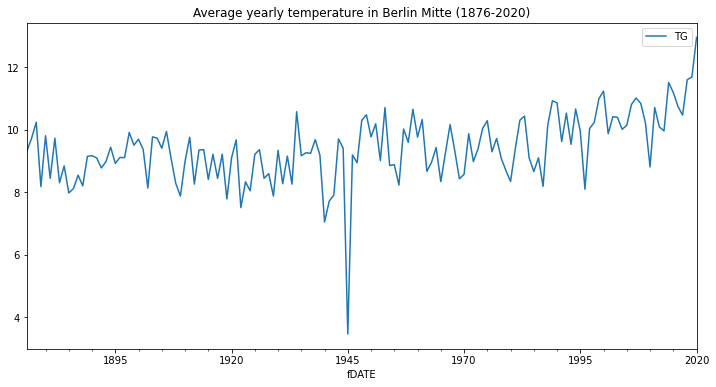

In [41]:
yearly_temp = df.resample("1y")[['TG']].mean()
yearly_temp.plot(title='Average yearly temperature in Berlin Mitte (1876-2020)')

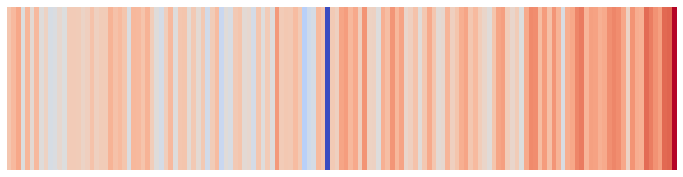

In [42]:
plt.figure(figsize=(12, 3))
sns.heatmap(yearly_temp.T, cmap='coolwarm', 
            xticklabels=[], yticklabels=[], # switch off all labels
            cbar=False
           )
_ = plt.xlabel(None)

## Correlations

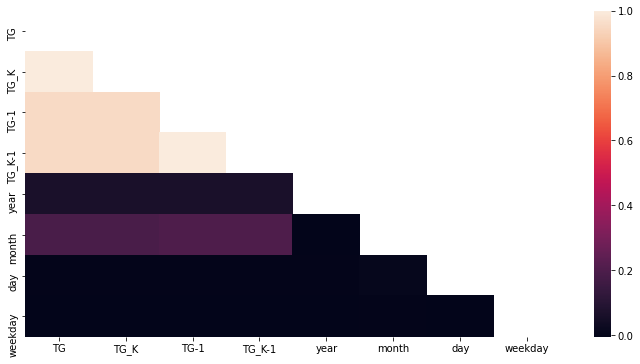

In [43]:
mask = np.triu(np.ones_like(df.corr(), dtype=np.bool))
sns.heatmap(df.corr(), mask=mask)

In [82]:
df.corr()

,TG,TG_K,TG-1,TG_K-1,year,month,day,weekday
TG,1.000000,1.000000,0.953035,0.953035,0.064588,0.191143,0.003206,-0.002511
TG_K,1.000000,1.000000,0.953035,0.953035,0.064588,0.191143,0.003206,-0.002511
TG-1,0.953035,0.953035,1.000000,1.000000,0.064498,0.202225,0.001394,-0.003058
TG_K-1,0.953035,0.953035,1.000000,1.000000,0.064498,0.202225,0.001394,-0.003058
year,0.064588,0.064588,0.064498,0.064498,1.000000,-0.003930,-0.000004,-0.000050
month,0.191143,0.191143,0.202225,0.202225,-0.003930,1.000000,0.010529,0.000226
day,0.003206,0.003206,0.001394,0.001394,-0.000004,0.010529,1.000000,-0.000336
weekday,-0.002511,-0.002511,-0.003058,-0.003058,-0.000050,0.000226,-0.000336,1.000000


## TIME SERIES ANALYSIS

## Train-Test-Split


In [88]:
# Split into train set (last 5 years) and test set (last 12 months)
df_train = df.loc['2015-01-01':'2019-09-30']
df_test = df.loc['2019-10-01':]

# Keep only the temperature and district
df_train = df_train[['TG','TG_K','TG-1','difference','district']]
df_test = df_test[['TG','TG_K','TG-1','difference','district']]

### Check if the time series is stationary. 
Conditions of stationarity:
- constant mean
- constant standard deviation
- no seasonality

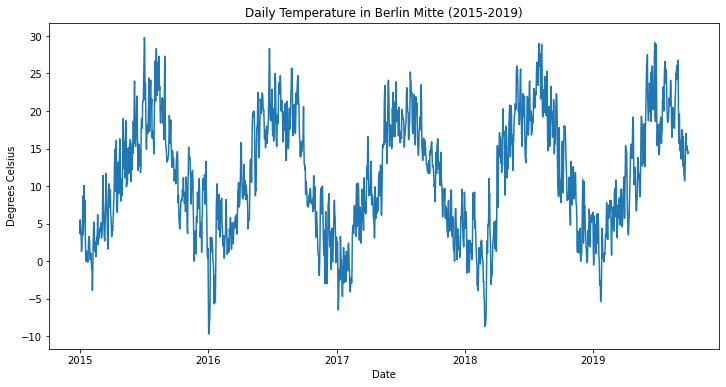

In [180]:
plt.plot(df_train.index, df_train['TG'])
plt.gca().set(title="Daily Temperature in Berlin Mitte (2015-2019)", xlabel='Date', ylabel="Degrees Celsius")
plt.show()

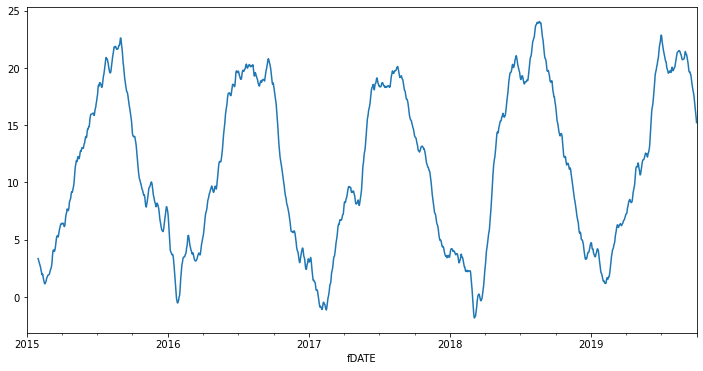

In [181]:
# Moving average of 30 days
df_train['TG'].rolling(window=30).mean().plot()

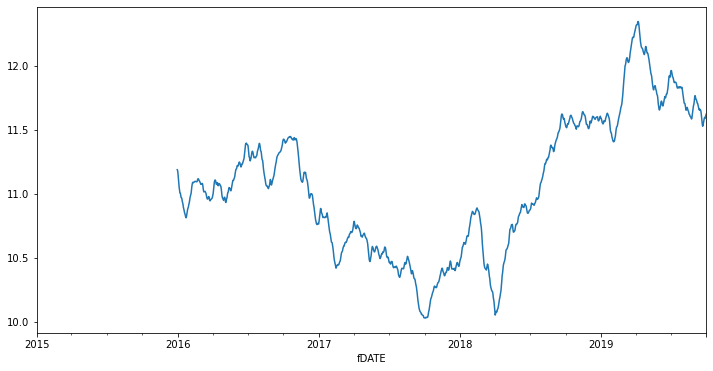

In [54]:
# Moving average of the year
df_train['TG'].rolling(window=365).mean().plot()

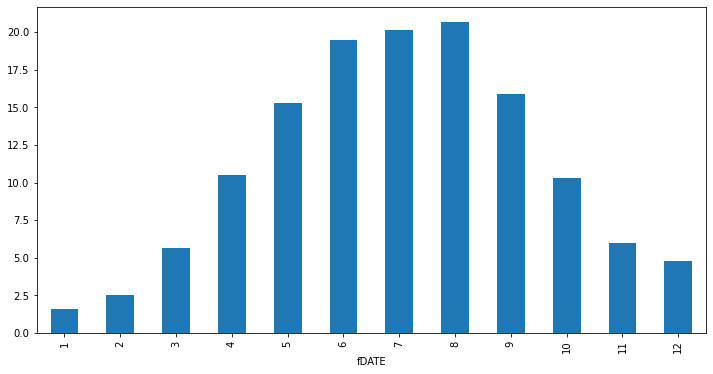

In [57]:
# Avg. temperature by month
months = df_train.index.month
df_train.groupby(months)['TG'].mean().plot(kind='bar')
#seasonal_mean = df_train.groupby('months')['TG'].mean()
#seasonal_mean.plot()

In [70]:
# Plot the average temperature per year
#sns.relplot(x=df_train.index.month, y=['TG'], hue=df_train.index.month, kind="line", data=df_train)

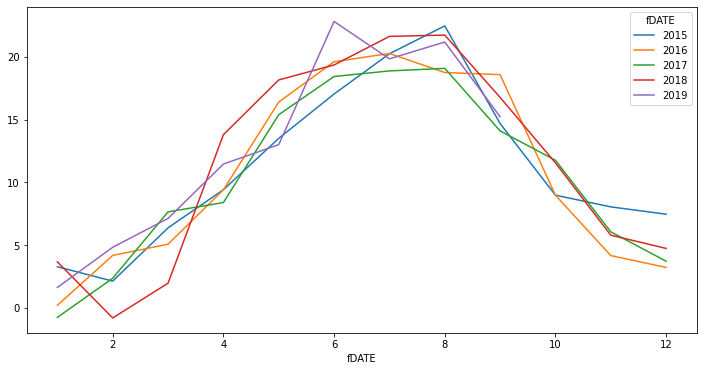

In [76]:
# Plot the average temperature per month by year
df_train.pivot_table('TG', index=df_train.index.month, columns=df_train.index.year).plot()

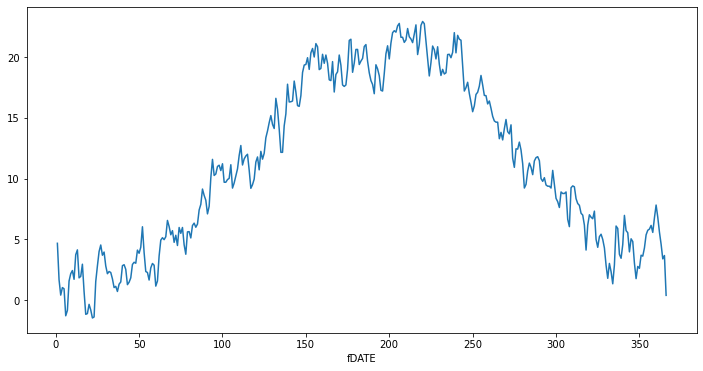

In [58]:
# mean for
df_train.groupby(df_train.index.dayofyear)['TG'].mean().plot()

Figure(864x432)
Figure(864x432)
Figure(864x432)


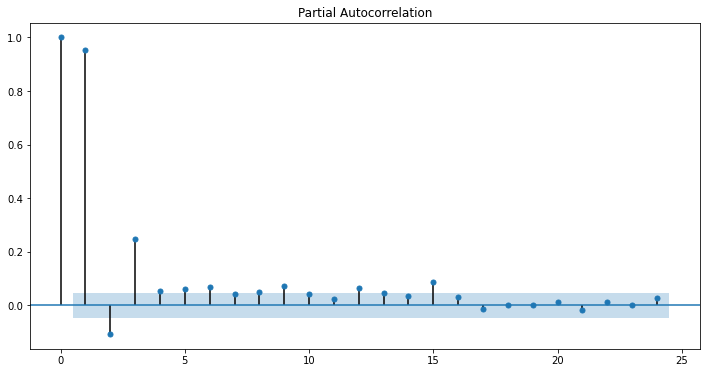

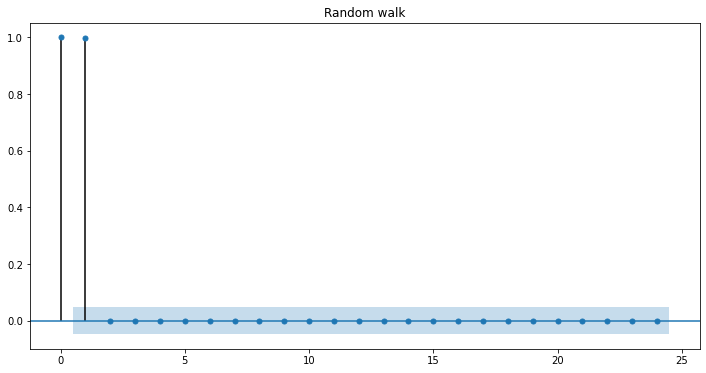

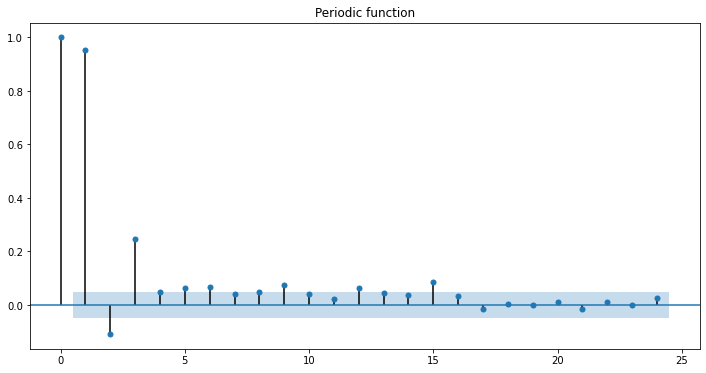

In [52]:
# Plot the partial autocorrelation
print(plot_pacf(df_train['TG'], lags=24))

# Plot random walk
print(plot_pacf(np.cumsum(df_train['TG']), lags=24, title='Random walk'))

# Plot a periodic function
periodic = np.sin(df_train['TG'] / 180 * np.pi)
print(plot_pacf(periodic, lags=24, title='Periodic function'))

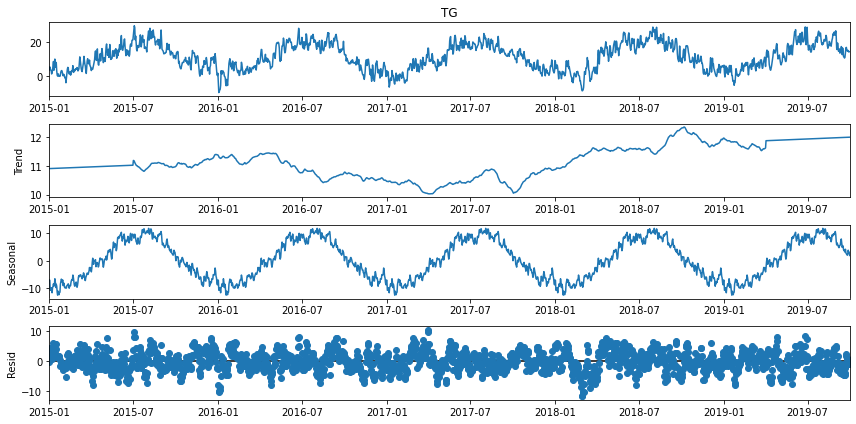

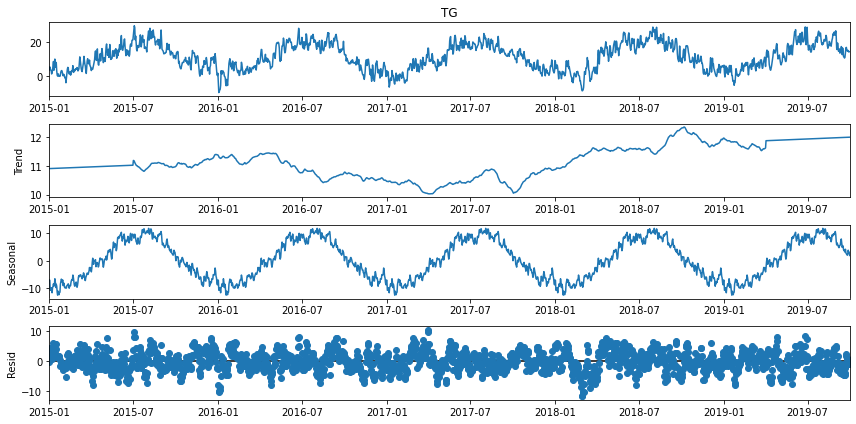

In [19]:
additive_decomposition = seasonal_decompose(df_train['TG'], model='additive', extrapolate_trend='freq', freq=365)
additive_decomposition.plot()

In [102]:
# Plot the daily temperature compared to the average temperature 
'''
df_test["baseline_mean"] = df_train["TG"].mean()
df_test[['baseline_mean','TG']].plot()
plt.gca().set(title="Daily Temperature in Berlin Mitte (01.10.2019-30.09.2020)", xlabel='Date', ylabel="Degrees Celsius")
plt.show()
'''

'\ndf_test["baseline_mean"] = df_train["TG"].mean()\ndf_test[[\'baseline_mean\',\'TG\']].plot()\nplt.gca().set(title="Daily Temperature in Berlin Mitte (01.10.2019-30.09.2020)", xlabel=\'Date\', ylabel="Degrees Celsius")\nplt.show()\n'

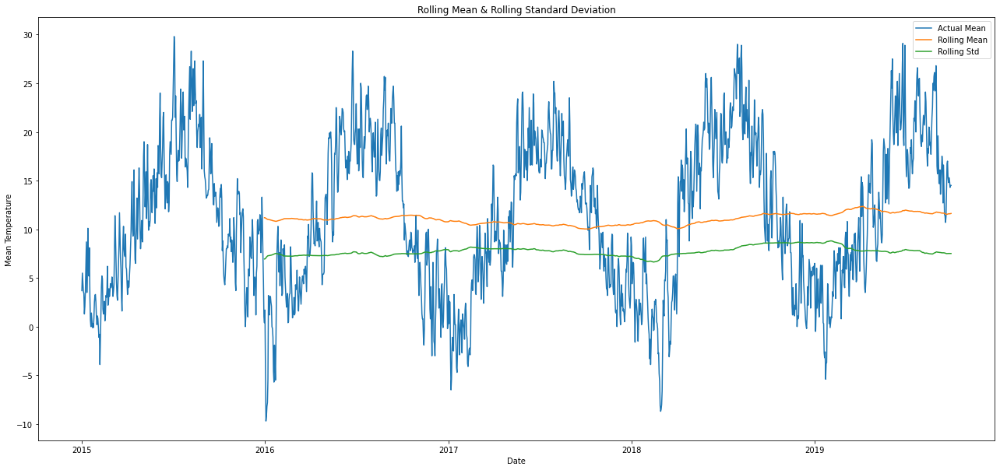

In [100]:
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# check rolling mean and rolling standard deviation

def plot_rolling_mean_std(ts):
    rolling_mean = ts.rolling(365).mean()
    rolling_std = ts.rolling(365).std()
    plt.figure(figsize=(22,10))

    plt.plot(ts, label='Actual Mean')
    plt.plot(rolling_mean, label='Rolling Mean')
    plt.plot(rolling_std, label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Mean Temperature")
    plt.title('Rolling Mean & Rolling Standard Deviation')
    plt.legend()
    plt.show()


plot_rolling_mean_std(df_train['TG'])

In [98]:
# Augmented Dickey–Fuller test

def perform_dickey_fuller_test(ts):
    result = adfuller(ts, autolag='AIC')
    print('Test statistic:', result[0])
    print('Critical Values:', result[4])

perform_dickey_fuller_test(df_train['TG'])

Test statistic: -2.737431084559627
Critical Values: {'1%': -3.4341598265624627, '5%': -2.863222825253062, '10%': -2.567665889522738}


- The PACF shows that the temperature today depends on the temperature of up to 10 days before, and 15 days before. The strongest dependency is t-1, t-2, and t-3.
- The time series shows strong seasonality, with temperatures peaks in the summer months and drops in the winter months.
- The rolling mean and the standard deviation are slightly increasing, which indicates a positive trend (global warming).
- The Dickey-Fuller Test result is lower than the 1% and 5% critical values, but slightly higher than the 10% value.

This means that the time series is not stationary, so I need to make it as such.

## Removing the trend
The trend is linear (temperature is increasing), so I use only the first difference.

" There are two main techniques for making the time series stationary.
- Decomposing
- Differencing
Here, we are preferring Differencing because it is very straight forward. We would use below co-relation plots to identify the order of differencing. "

In [104]:
df_train['timestep'] = np.arange(0, len(df_train))+1
df_train.head()

,TG,TG_K,TG-1,difference,district,timestep
fDATE,,,,,,
2015-01-01,3.7,276.85,2.3,1.4,Mitte,1
2015-01-02,5.5,278.65,3.7,1.8,Mitte,2
2015-01-03,4.5,277.65,5.5,-1.0,Mitte,3
2015-01-04,3.6,276.75,4.5,-0.9,Mitte,4
2015-01-05,3.4,276.55,3.6,-0.2,Mitte,5


The mean difference in daily temperature in Berlin Mitte (2015-2019) was 0.01 °C.


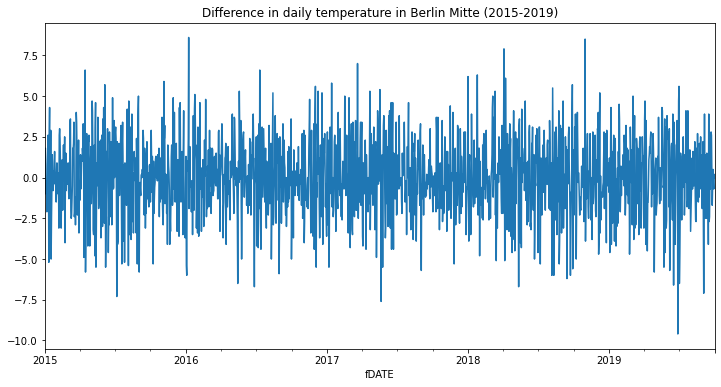

In [89]:
print('The mean difference in daily temperature in Berlin Mitte (2015-2019) was', round(df_train['difference'].mean(), 2), '°C.')
df_train['difference'].plot(title='Difference in daily temperature in Berlin Mitte (2015-2019)')

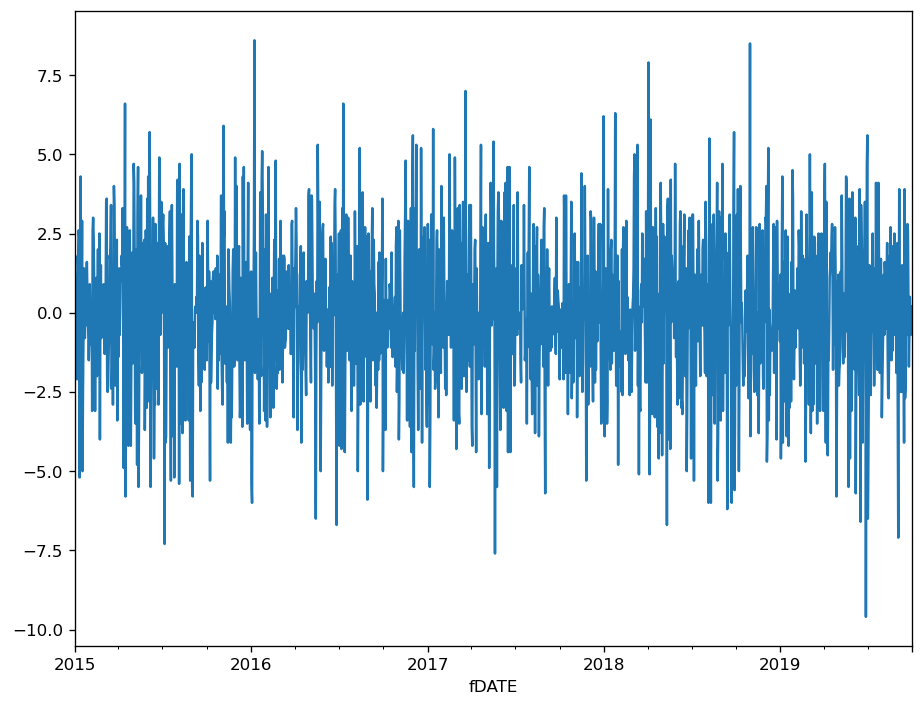

In [114]:
df_train['difference'].plot()

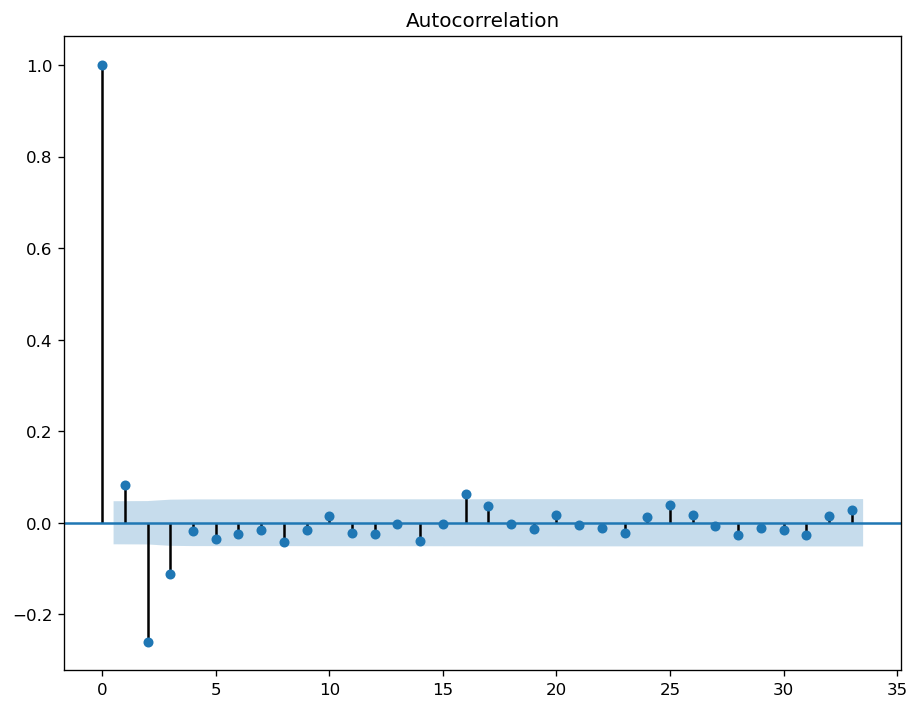

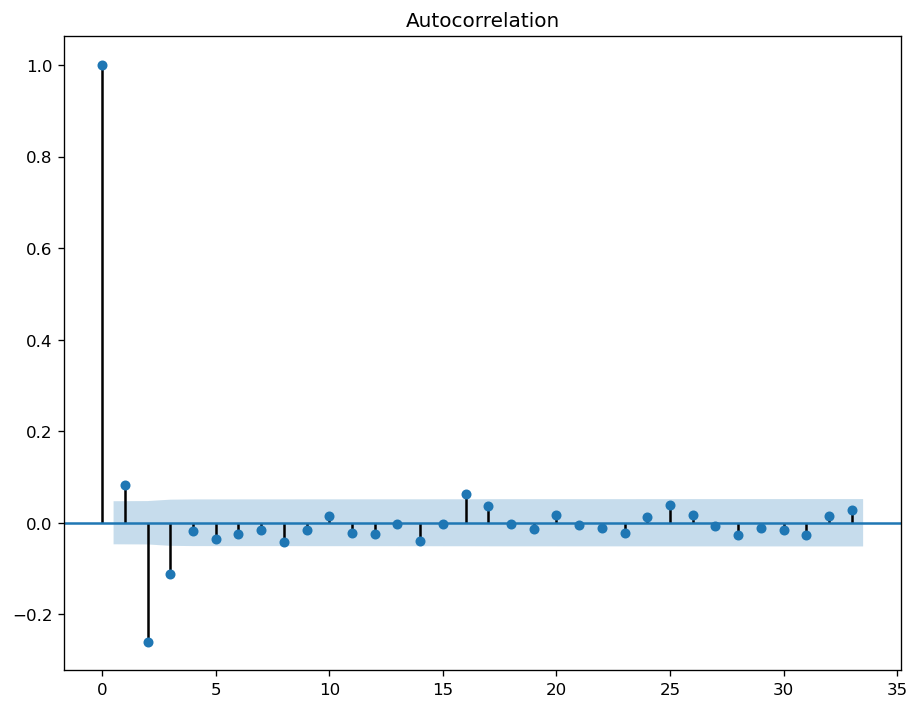

In [115]:
plot_acf(df_train['difference'])

Take only t-1, t-2, t-3

## Removing seasonality

In [68]:
# percentage change only for temperature Kelvin (>0)

df_train['percentage_change'] = df_train['TG_K'].pct_change()
df_train.head()
#df_train['percentage_change'].plot()

,SOUID,DATE,TG,Q_TG\n,district,year,month,day,weekday,TG_K,difference,difference_K,percentage_change
fDATE,,,,,,,,,,,,,
2015-01-01,121152,20150101,3.7,0,Mitte,2015,1,1,3,276.85,NaN,NaN,NaN
2015-01-02,121152,20150102,5.5,0,Mitte,2015,1,2,4,278.65,1.8,1.8,0.006502
2015-01-03,121152,20150103,4.5,0,Mitte,2015,1,3,5,277.65,-1.0,-1.0,-0.003589
2015-01-04,121152,20150104,3.6,0,Mitte,2015,1,4,6,276.75,-0.9,-0.9,-0.003241
2015-01-05,121152,20150105,3.4,0,Mitte,2015,1,5,0,276.55,-0.2,-0.2,-0.000723


In [69]:
monthly_pct_change = df_train.groupby('month')['percentage_change'].transform('mean')
df_train['ds'] = df_train['percentage_change'] - monthly_pct_change

In [117]:
# Calculate the monthly mean difference in temperature
df_train.groupby(df_train.index.month)['difference'].mean()

fDATE
1    -0.043226
2     0.012057
3     0.185161
4     0.129333
5     0.243871
6     0.034000
7     0.021290
8     0.016129
9    -0.282000
10   -0.144355
11   -0.210833
12    0.047581
Name: difference, dtype: float64

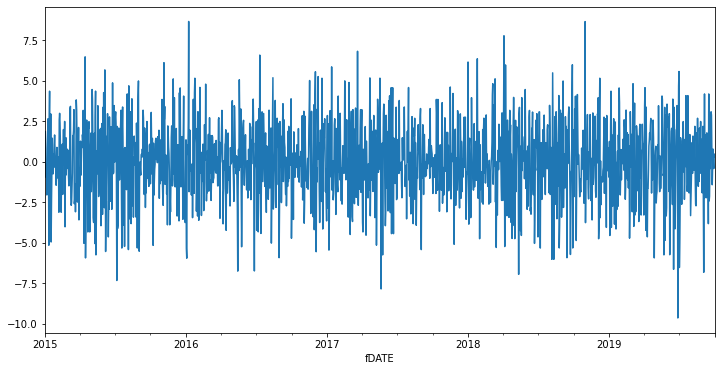

In [71]:
# Create deseasonalized data

monthly_diff = df_train.groupby('month')['difference'].transform('mean')
df_train['diff_ds'] = df_train['difference'] - monthly_diff
df_train['diff_ds'].plot()

In [72]:
# Demean the percentage change

df_train['monthly_mean'] = df_train.groupby('month')['percentage_change'].transform('mean')
df_train['deseasonalized'] = df_train['percentage_change'] - df_train['monthly_mean']
df_train.tail()

,SOUID,DATE,TG,Q_TG\n,district,year,month,day,weekday,TG_K,difference,difference_K,percentage_change,ds,diff_ds,monthly_mean,deseasonalized
fDATE,,,,,,,,,,,,,,,,,
2019-09-26,121152,20190926,15.3,0,Mitte,2019,9,26,3,288.45,0.5,0.5,0.001736,0.002675,0.782,-0.000938,0.002675
2019-09-27,121152,20190927,15.0,0,Mitte,2019,9,27,4,288.15,-0.3,-0.3,-0.001040,-0.000102,-0.018,-0.000938,-0.000102
2019-09-28,121152,20190928,14.3,0,Mitte,2019,9,28,5,287.45,-0.7,-0.7,-0.002429,-0.001491,-0.418,-0.000938,-0.001491
2019-09-29,121152,20190929,14.5,0,Mitte,2019,9,29,6,287.65,0.2,0.2,0.000696,0.001634,0.482,-0.000938,0.001634
2019-09-30,121152,20190930,14.5,0,Mitte,2019,9,30,0,287.65,0.0,0.0,0.000000,0.000938,0.282,-0.000938,0.000938


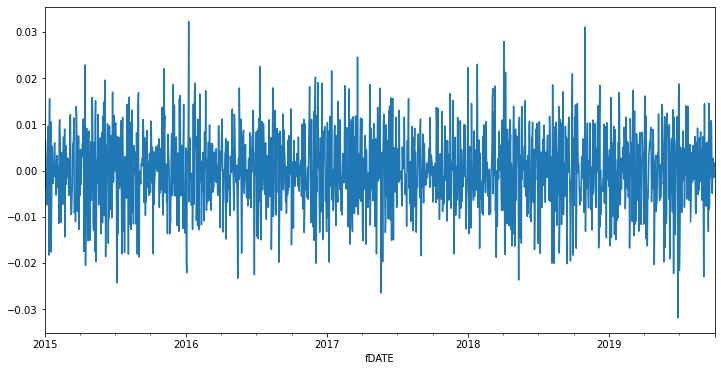

In [73]:
df_train['deseasonalized'].plot()

## FORECAST

## Linear Regression

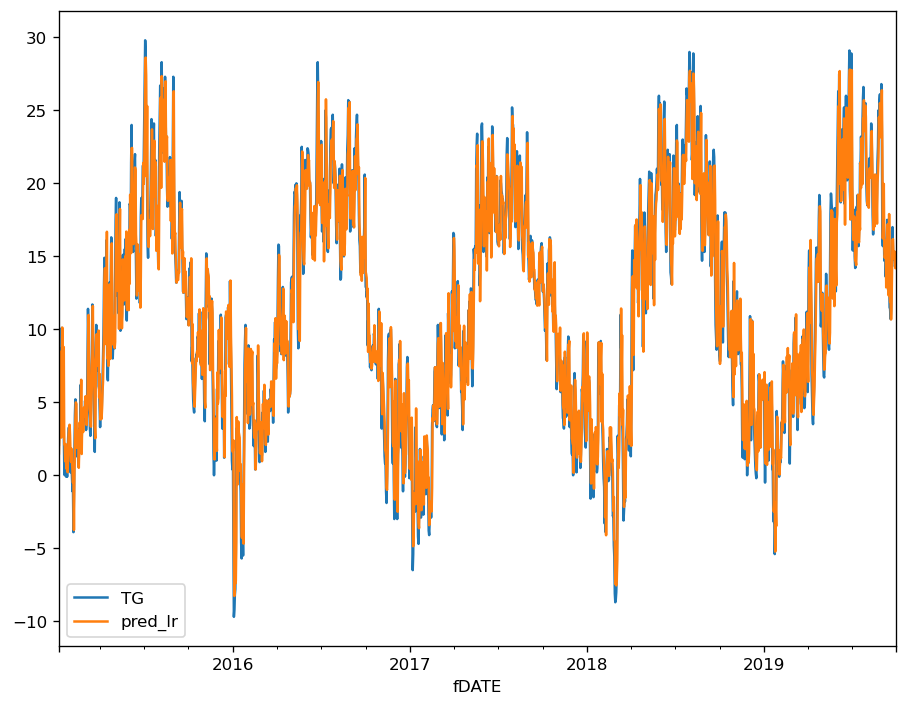

In [122]:
#df_train['t-1'] = df_train['TG'].shift(1)
#df_train['t-2'] = df_train['TG'].shift(2)
#df_train['t-3'] = df_train['TG'].shift(3)

df_train.dropna(inplace=True)
X_lr = df_train[['t-1','t-2','t-3']]
y_lr = df_train['TG']

lr = LinearRegression()

lr.fit(X_lr, y_lr)
pred_lr = lr.predict(X_lr)
df_train['pred_lr'] = lr.predict(X_lr)
df_train[['TG', 'pred_lr']].plot()

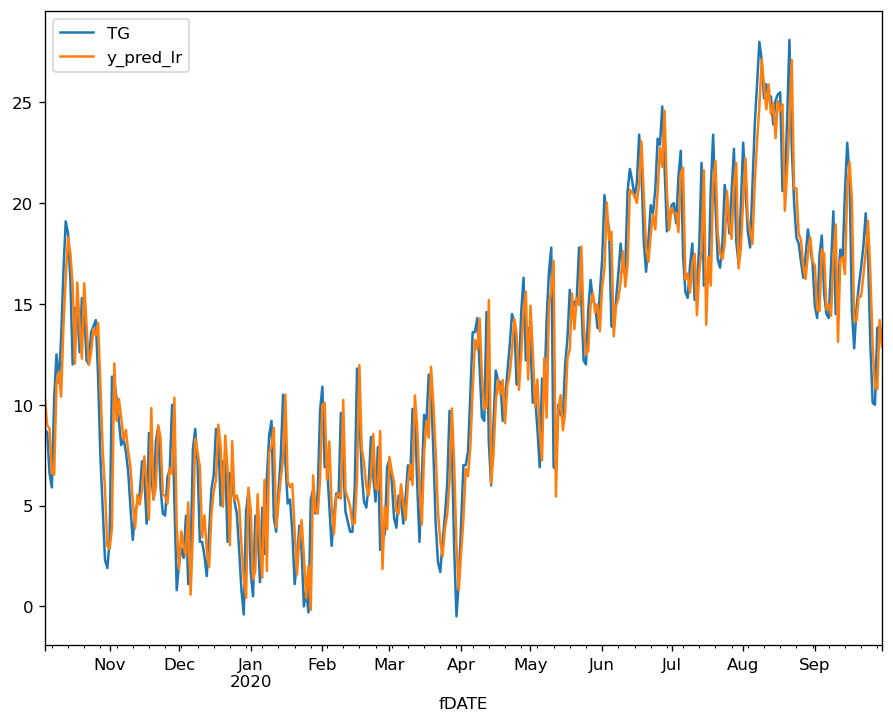

In [134]:
# Linear Regression on the test data

df_test['t-1'] = df_test['TG'].shift(1)
df_test['t-2'] = df_test['TG'].shift(2)
df_test['t-3'] = df_test['TG'].shift(3)

df_test.dropna(inplace=True)
X_train_lr = df_train[['t-1','t-2','t-3']]
y_train_lr = df_train['TG']
X_test_lr = df_test[['t-1','t-2','t-3']]

lr = LinearRegression()

lr.fit(X_train_lr, y_train_lr)
y_test_lr = lr.predict(X_test_lr)
df_test['y_pred_lr'] = y_test_lr
df_test[['TG', 'y_pred_lr']].plot()

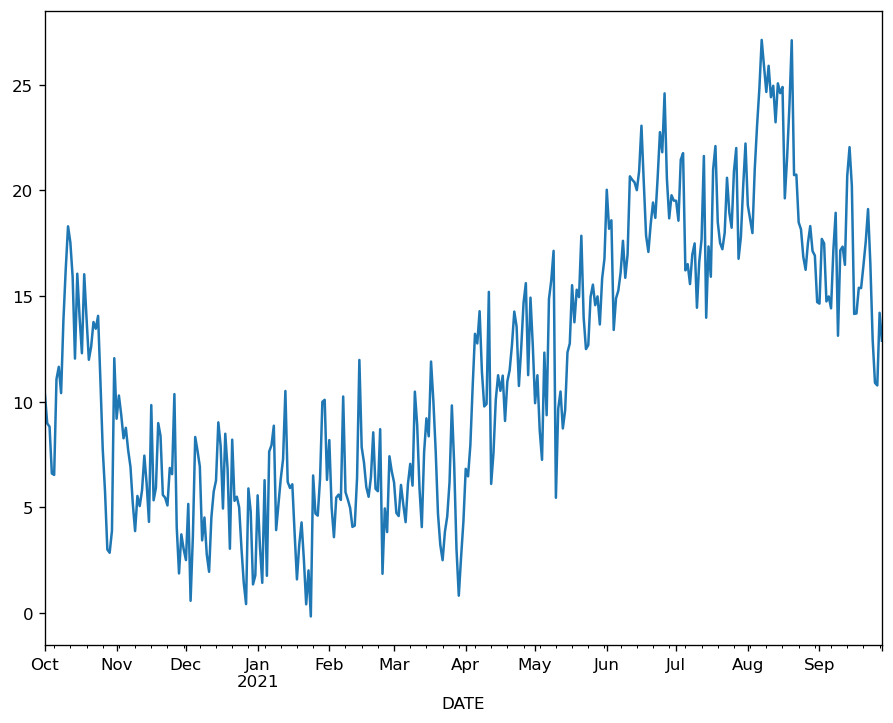

In [162]:
# Temperature forecast for September 2020 to September 2021

year_ahead = pd.read_csv('oct_20.csv')
year_ahead['DATE'] = pd.to_datetime(year_ahead['DATE'], format='%Y-%m-%d')
year_ahead = year_ahead.set_index('DATE')

predictions_lr = lr.predict(X_test_lr)
year_ahead['pred_lr'] = predictions_lr
year_ahead['pred_lr'].plot()

## Baseline Model I

In [165]:
# A most basic model in which it uses the current temperature as a prediction for the next day. So the temperature today depends only on the temperature yesterday, and so on.
# Calculate the RMSE

temp_pred_err = sqrt(MSE(df['TG'], df['TG-1']))
print("RMSE:",temp_pred_err)

RMSE: 2.412738083115462


This RMSE means that the most basic 1-step prediction baseline model predicts the next day's temperature with the average error of 2.4 degrees Celsius. The error is acceptable, especially in the Weather Forecast field in which there are many other attributes that also affect the weather (e.g wind speed, atmospheric pressure, humidity, etc).

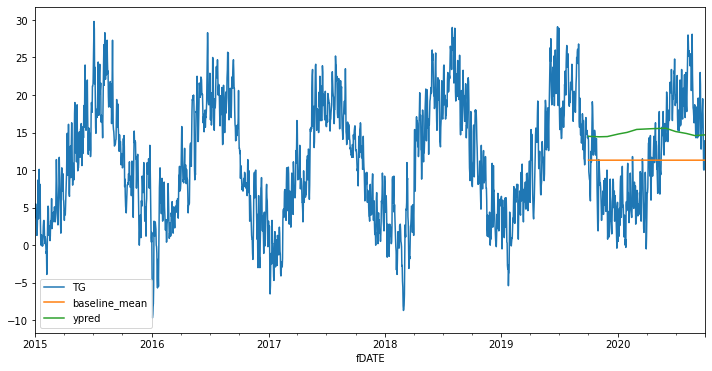

In [108]:
first = df_train['TG'].iloc[-1]

# put test + pred in one df so it is easier to plot

ypred = np.cumprod(monthly_pct_change.values[:366] + 1) * first
#ypred = np.cumprod(monthly_diff.values[:366]) * first
df_test['ypred'] = pd.Series(index=df_test.index, data=ypred)

# everything in one plot - nicer
final = pd.concat([df_train, df_test], sort=False)
final[['TG', 'baseline_mean', 'ypred']].plot()

## ARIMA (AutoRegressive Integrated Moving Average)
The ARIMA model takes three parameters:
- AR: p = the number of lags of Y to be used as predictors; the point where PACF crosses the upper confidence level.
- I : d = number of nonseasonal differences needed for stationarity; the minimum number of differencing needed to make the series stationary; the difference order (if the time series is already stationary,d=0); check with ADF.
- MA: q = the number of lagged forecast errors that should go into the ARIMA Model; the point where ACF crosses the upper confidence level.

Explanation and code help https://www.kaggle.com/amar09/time-series-delhi-weather-forecasting-arima/

Test statistic: -2.806652236708772
Critical Values: {'1%': -3.4341731910406272, '5%': -2.863228724653988, '10%': -2.567669030830819}


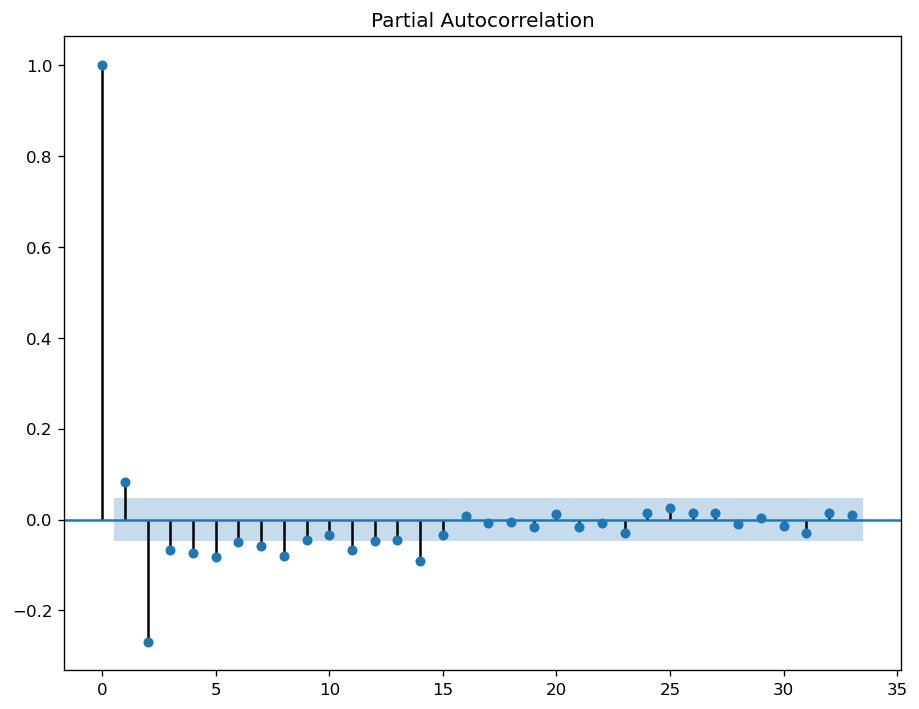

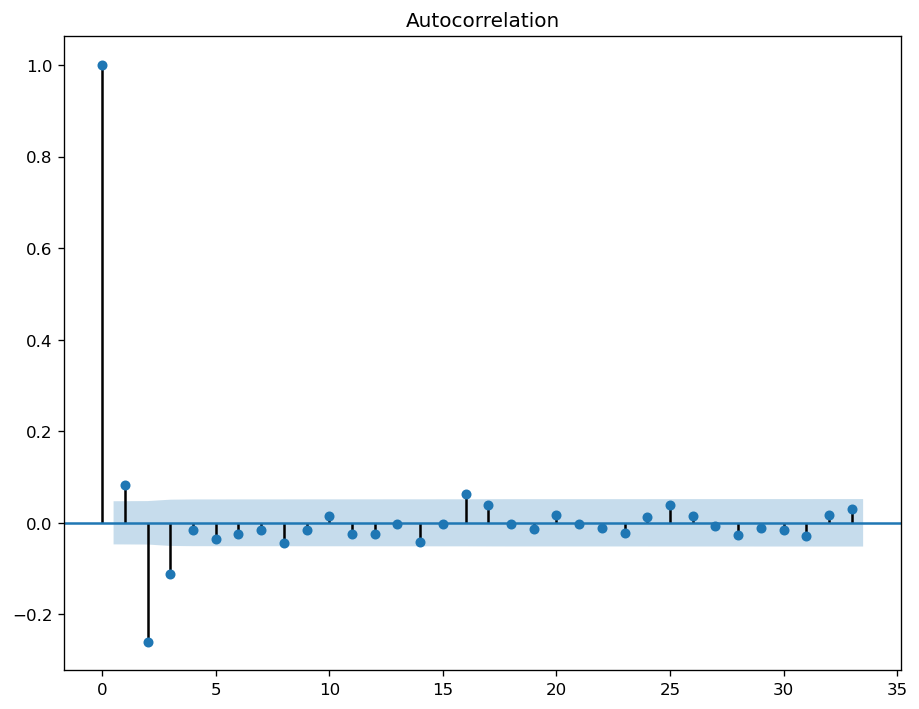

In [179]:
# value of p
plot_pacf(df_train['difference'])

# value of q
plot_acf(df_train['difference'])

# value of d
def perform_dickey_fuller_test(ts):
    result = adfuller(ts, autolag='AIC')
    print('Test statistic:', result[0])
    print('Critical Values:', result[4])

perform_dickey_fuller_test(df_train['TG'])

In [180]:
# ARIMA with found parameters (2,1,3)

arima_model = ARIMA(df_train['TG'].values, order=(2,1,3))
arima_fit = arima_model.fit(disp=0)
print(arima_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 1727
Model:                 ARIMA(2, 1, 3)   Log Likelihood               -3824.134
Method:                       css-mle   S.D. of innovations              2.215
Date:                Wed, 28 Oct 2020   AIC                           7662.268
Time:                        17:27:46   BIC                           7700.447
Sample:                             1   HQIC                          7676.391
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0065      0.020      0.321      0.748      -0.033       0.046
ar.L1.D.y      0.9567      0.312      3.069      0.002       0.346       1.568
ar.L2.D.y     -0.1906      0.181     -1.054      0.2

The coefficients of AR and MA above 1 are insignificant, so I will stick to a basic model of (1,1,1).

In [167]:
# Basic ARIMA model with p,d,q=1,1,1

arima_model = ARIMA(df_train['TG'].values, order=(1,1,1))
arima_fit = arima_model.fit(disp=0)
print(arima_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 1727
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -3899.261
Method:                       css-mle   S.D. of innovations              2.314
Date:                Wed, 28 Oct 2020   AIC                           7806.521
Time:                        14:38:24   BIC                           7828.338
Sample:                             1   HQIC                          7814.591
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0073      0.062      0.118      0.906      -0.114       0.129
ar.L1.D.y     -0.4488      0.070     -6.381      0.000      -0.587      -0.311
ma.L1.D.y      0.6147      0.061     10.123      0.0

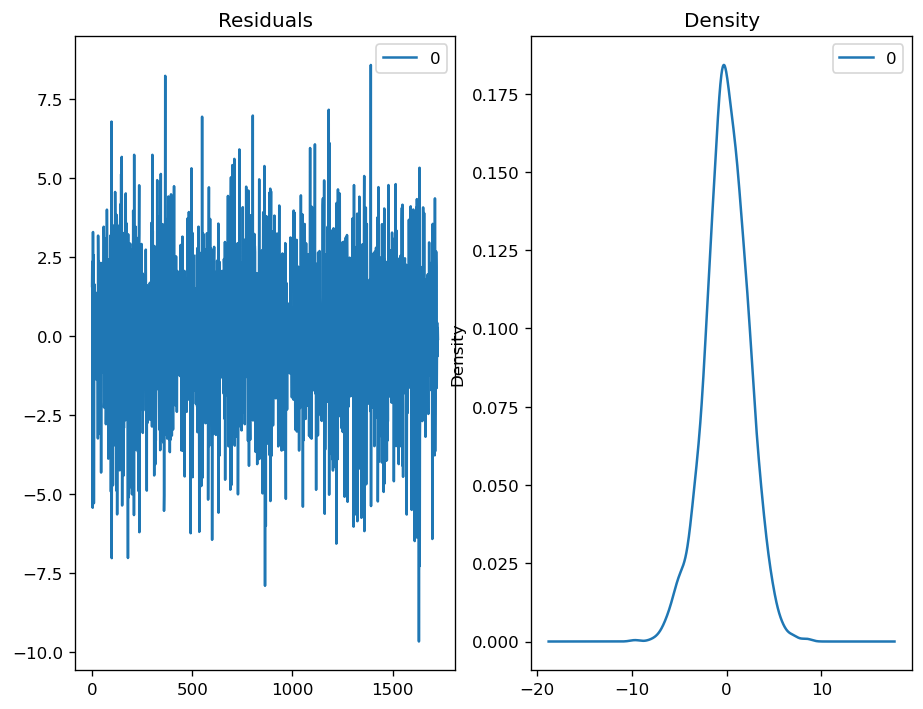

In [168]:
# Plot residual errors, to ensure there is constant mean and variance.

arima_residuals = pd.DataFrame(arima_fit.resid)
fig, ax = plt.subplots(1,2)
arima_residuals.plot(title="Residuals", ax=ax[0])
arima_residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

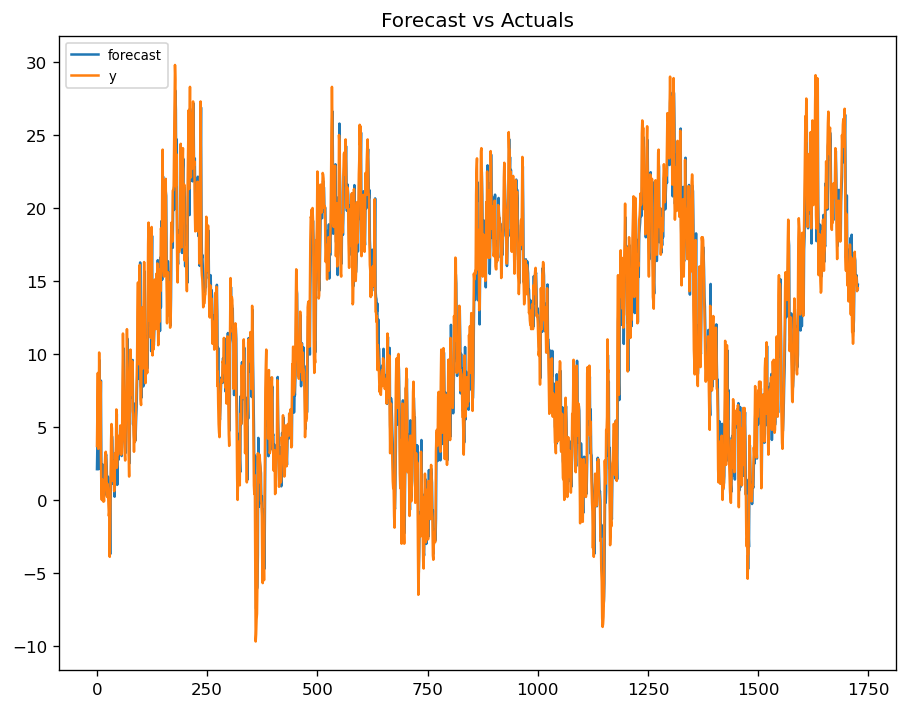

In [181]:
# Plot the actual against the fitted values
arima_fit.plot_predict(dynamic=False) #dynamic=False: the in-sample lagged values are used for prediction.
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

Next step: Out-of-Time cross-validation: take few steps back in time and forecast into the future to as many steps you took back. Then you compare the forecast against the actuals. To do out-of-time cross-validation, you need to create the training and testing dataset by splitting the time series into 2 contiguous parts in approximately 75:25 ratio or a reasonable proportion based on time frequency of series.

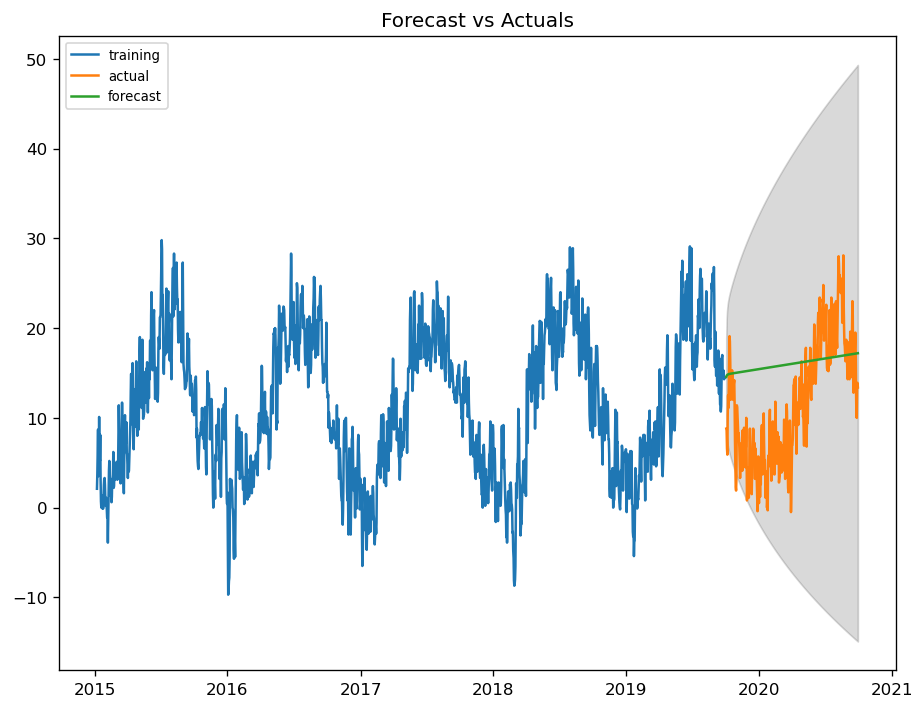

In [208]:
# Forecast
fc, se, conf = arima_fit.forecast(363, alpha=0.05)  # 95% conf

# print(fc)
# Make as pandas series
fc_series = pd.Series(fc, index=df_test.index)
lower_series = pd.Series(conf[:, 0], index=df_test.index)
upper_series = pd.Series(conf[:, 1], index=df_test.index)

# Plot
plt.plot(df_train['TG'], label='training')
plt.plot(df_test['TG'], label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()
# test_df.index

The model seems to give a directionally correct forecast, and the actual observed values lie within the 95% confidence band.

### Evaluation metric for ARIMA models
Typically, MAPE, Correlation and Min-Max Error are used, because they are percentage errors that vary between 0 and 1. That way, you can judge how good is the forecast irrespective of the scale of the series.

Other metrics are quantities.

In [211]:
# Evaluate the accuracy of the ARIMA model

def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual)) 
    me = np.mean(forecast - actual)
    mae = np.mean(np.abs(forecast - actual))
    mpe = np.mean((forecast - actual)/actual)
    rmse = np.mean((forecast - actual) ** 2) ** 0.5 
    corr = np.corrcoef(forecast, actual)[0,1]
    mins = np.amin(np.hstack([forecast[:,None], actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)
    #acf1 = acf(fc - df_test)[1] 

    return({'mape':mape, 'me':me, 'mae': mae, 'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

forecast_accuracy(fc, df_test['TG'])

{'mape': inf,
 'me': 4.413379952056132,
 'mae': 6.375686719957242,
 'mpe': inf,
 'rmse': 7.646340648451126,
 'corr': 0.7012377647993231,
 'minmax': 0.38960591231987585}

In [ ]:
#Around 2.2% MAPE implies the model is about 97.8% accurate in predicting the next 15 observations.

## SARIMAX
Source: https://github.com/imkhoa99/Time-Series-Analysis-and-Weather-Forecast-/blob/master/Time_Series_Project.ipynb

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)
SARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:13989.050320827253
SARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:12559.254012236954
SARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:10595.276768609045
SARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:10266.950009542485
SARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:10543.810983159754
SARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:10323.559697830424
SARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:10263.930304714362
SARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:10247.706912960626
SARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:11895.947565158127
SARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:10714.780810578523
SARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:9317.133691427634
SARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:8902.043260156139
SARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:9241.197323167009
SARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:8948.354086383564
SARIMA(0,

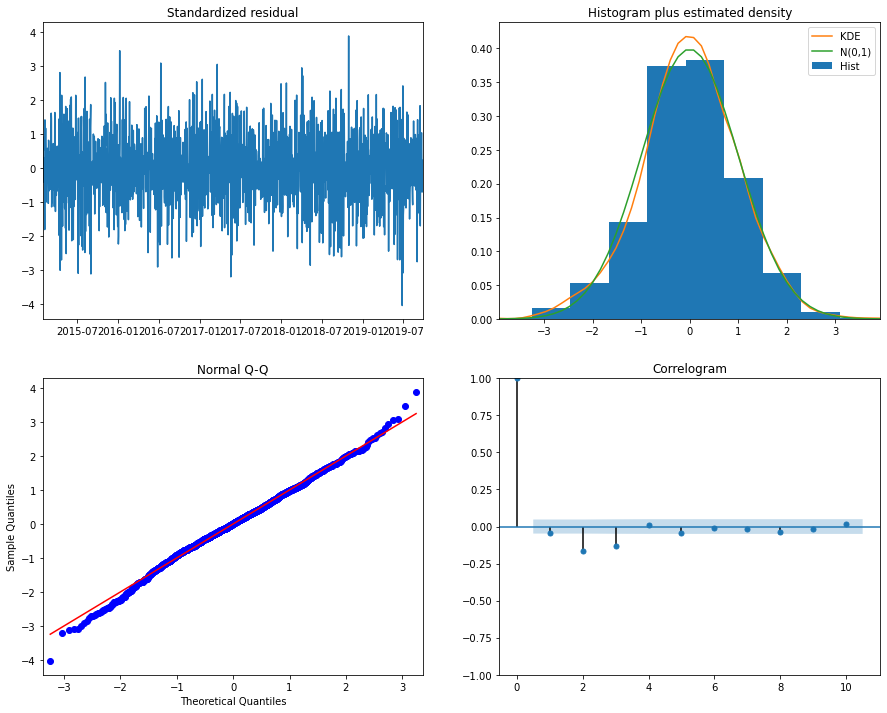

In [91]:
import itertools

# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))


import warnings
warnings.filterwarnings("ignore") # specify to ignore warning messages

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(one_step_df['TG_actual'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('SARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue



# Import the statsmodels library for using SARIMAX model
import statsmodels.api as sm

# Fit the SARIMAX model using optimal parameters
mod = sm.tsa.statespace.SARIMAX(one_step_df['TG_actual'],
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results = mod.fit()


results.plot_diagnostics(figsize=(15, 12))
plt.show()

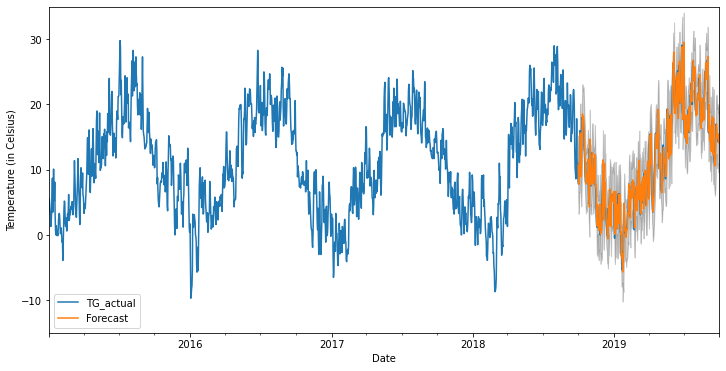

In [93]:
# Validating

pred = results.get_prediction(start=pd.to_datetime('2018-10-01'), dynamic=False)
pred_ci = pred.conf_int()

ax = one_step_df['TG_actual']['2015':].plot()
pred.predicted_mean.plot(ax=ax, label='Forecast')

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Temperature (in Celsius)')
plt.ylim([-15,35])
plt.legend()
plt.show()

Overall, our forecasts align with the true values very well, showing a seasonal cycle of length 365 days.

In [95]:
# Forecast diagnostic
y_forecasted = pred.predicted_mean
y_truth = one_step_df['TG_actual']
print(y_forecasted.shape)
print(y_truth.shape)

# Compute the mean square error
mse = sqrt(MSE(y_truth, y_forecasted).mean())
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

(365,)
(1733,)


ValueError: Found input variables with inconsistent numbers of samples: [1733, 365]

## Linear Regression

Construct a Ridge Regression model for your temperature data:

- Add a column containing the values from 0 to N as a time axis for prediction.
- Split the data into a training and test dataset. Use the last 12 months for testing.
- Train a Ridge Regression model on your data.
- Predict a values for the test period and plot them together with the true result.



## MAPPING

In [150]:
import folium
import re
import pandas as pd
import random

#Source: https://github.com/m-hoerz/berlin-shapes
berlin_bezirke = '/home/lorena/Documents/bootcamp/W05/data/berliner-bezirke.geojson'
geojson = open(berlin_bezirke).read()
districts = re.findall(r'spatial_alias": "([^,]+)",', geojson)

berlin = folium.Map(location=[52.54, 13.36],
                    zoom_start=10,
                    tiles='CartoDB positron')

berlin.choropleth(
    geo_data=berlin_bezirke,
    name='chloropleth',
    data=df_clean,
    columns=['district', 'TG'],
    key_on='properties.spatial_alias',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Temperature in degrees Celsius'
)

folium.LayerControl().add_to(berlin)
berlin

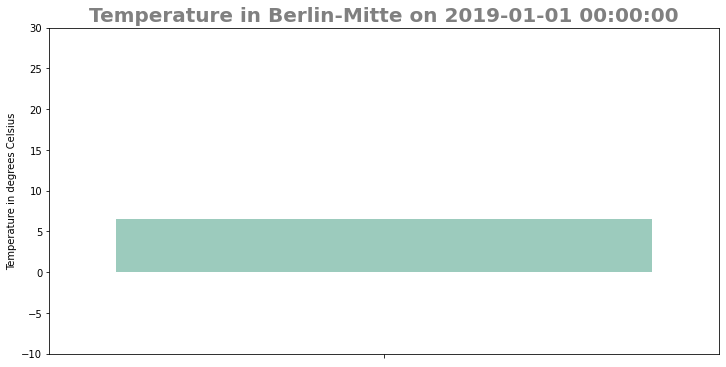

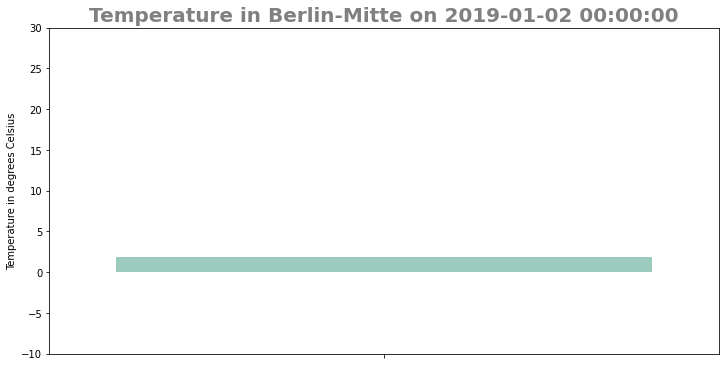

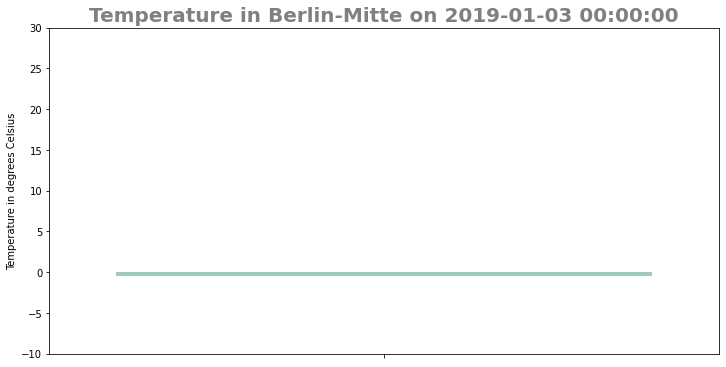

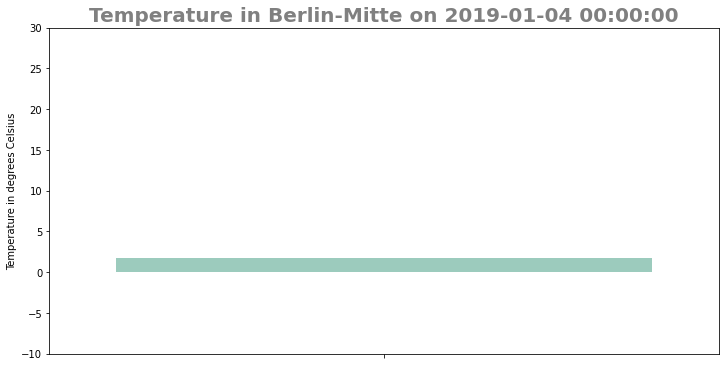

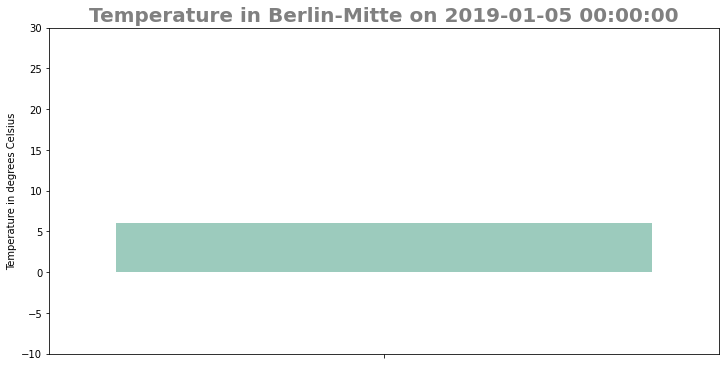

...

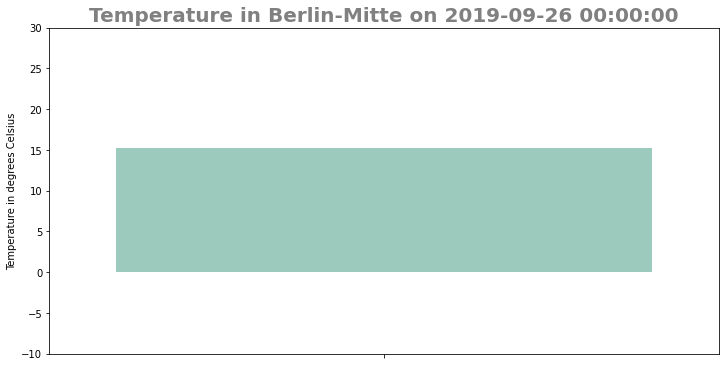

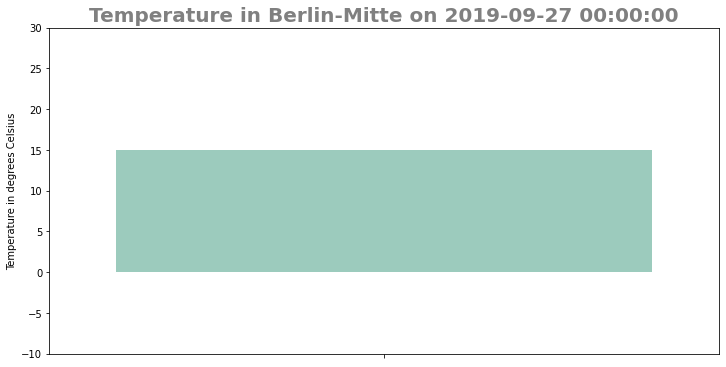

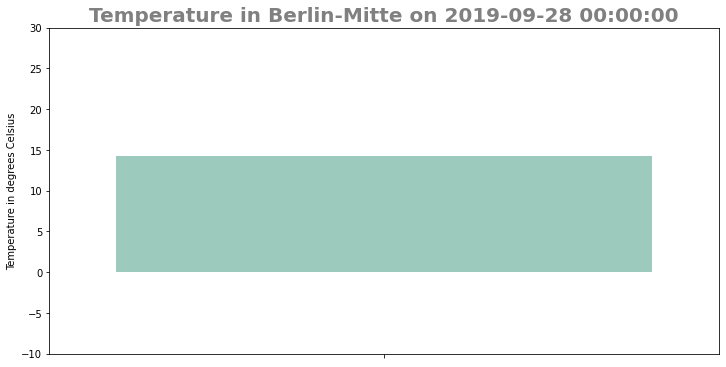

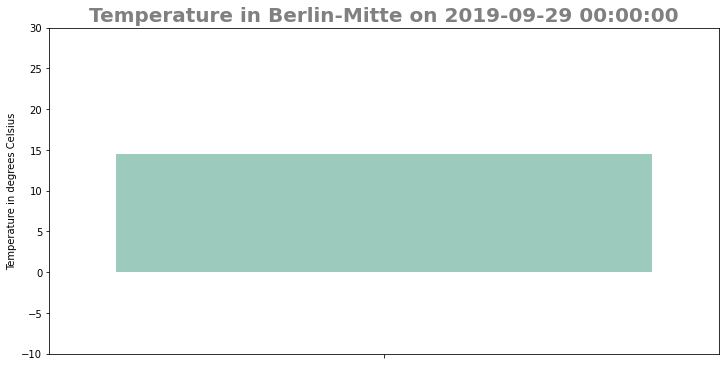

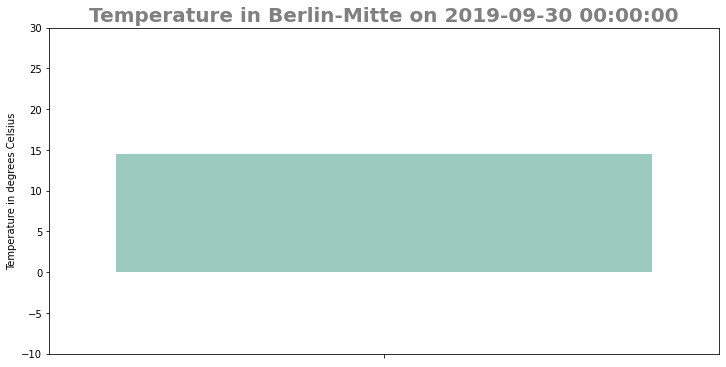

<Figure size 864x432 with 0 Axes>

In [167]:
import imageio
import os

images = []
folder='/home/lorena/Documents/bootcamp/W05/images'

if not os.path.exists(folder):
    os.mkdir(folder)

for date in pd.date_range(start="2019-01-01",end="2019-09-30"):
    
    plt.axis((-10, 30,-10,30))
    
    sns.barplot('TG',data=df.loc[df['fDATE']==date], orient='v', alpha=0.7, palette='Set2')
    
    plt.title(f'Temperature in Berlin-Mitte on {date}', loc='center', fontsize=20, color='grey', fontweight='bold')

    plt.ylabel('Temperature in degrees Celsius')
    
    filename = f'tempmitte_{date}.png'
    
    plt.savefig(os.path.join(folder,filename))
    
    images.append(imageio.imread(os.path.join(folder,filename)))
    
    plt.figure()
    
imageio.mimsave(os.path.join(folder,'temp_mitte_daily.gif'), images, fps=20)